In [1]:
from pygel3d import hmesh, jupyter_display as jd, gl_display as gl, graph
import numpy as np
import math
from commons.utils import *
from commons.display import *
from medial_axis_loader import from_qmat, from_dpc
from medial_axis_processing import unfolding, inverse_apply
from scipy.spatial import KDTree

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
input_mesh = hmesh.load("data/input/hand.off")

# jd.display(input_mesh)

In [4]:
# For DPC input
ma_input = "data/dpc/hand.dpc"
medial_axis = from_dpc.load(input_mesh, ma_input)

# # For QMAT input
# ma_input = "data/qmat/hand.ma___v_100___e_185___f_86.ma"
# medial_axis = from_qmat.load(input_mesh, ma_input)

In [5]:
# medial_axis.correspondences[1215] = medial_axis.correspondences[1215].tolist()
# medial_axis.correspondences[1215].remove(2486)
# medial_axis.correspondences[1215]

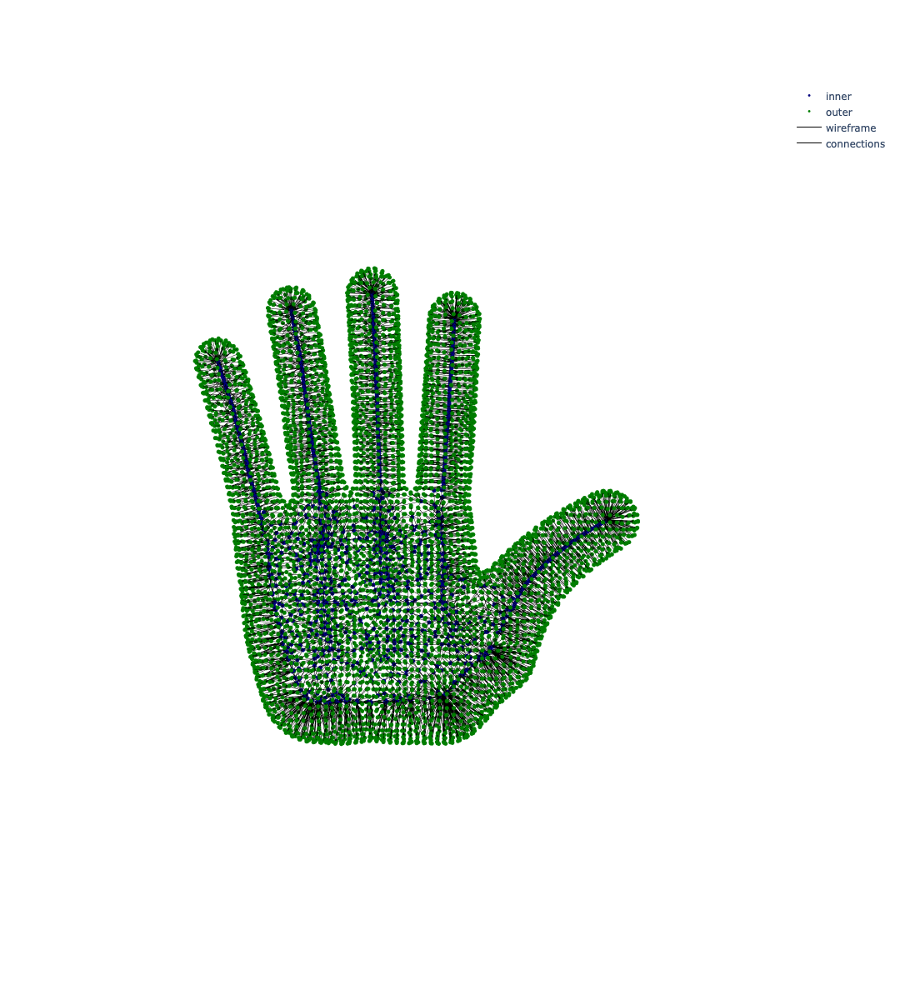

In [6]:
display_medial_axis(medial_axis)

In [7]:
unfolded_sheet = unfolding.get_unfolded_sheet_positions(medial_axis)
unfolded_curves = unfolding.get_unfolded_curve_positions(medial_axis, medial_axis.sheet.positions(), unfolded_sheet)

In [8]:
updated_sheet = hmesh.Manifold(medial_axis.sheet)
updated_sheet.positions()[:] = unfolded_sheet
hmesh.flip_orientation(updated_sheet)

In [9]:
inverse_apply.apply_inverse_medial_axis_transform(medial_axis, unfolded_sheet, unfolded_curves)

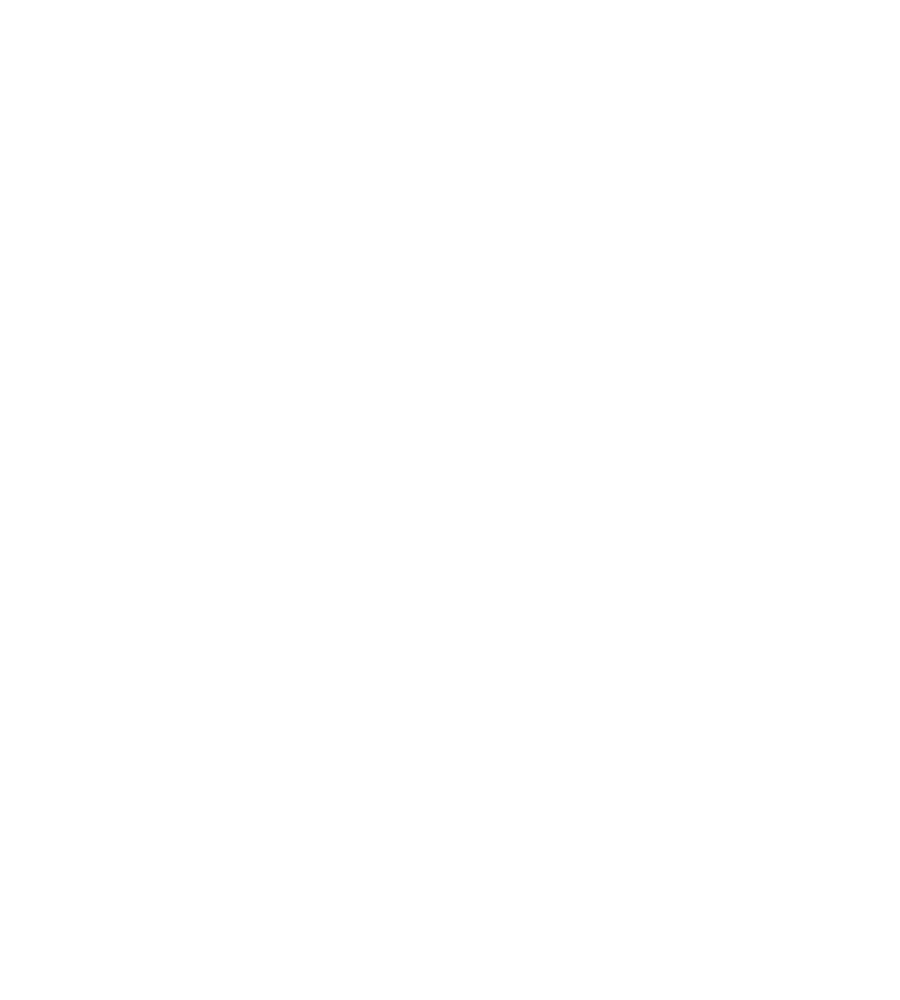

In [10]:
display_mesh(medial_axis.surface)